In [1]:
import pandas as pd
from cleaning_function import * 
import numpy as np
import random
np.random.seed(222)
random.seed(222)
import matplotlib.pyplot as plt


data = pd.read_csv('cvrm_master.csv')
data.replace([np.inf, -np.inf], np.nan, inplace=True)

/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_73892/823707655.py:10: DtypeWarning: Columns (1697,1698) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('cvrm_master.csv')


# Clean up and general motivations, and also maps


In [2]:
print(list(data.columns))

['statecounty_x', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2016', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2017', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2018', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2019', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2020', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2021', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2016', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2017', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2018', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2019', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2020', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2021', 'Populations_Vulnerable_to_Predicted_Surface_Smoke_from_Wildland_Fires_NOAA2020', 'AirPollutant: 1,3-butadiene_ug/m^3_EPA2018', 'AirPoll

In [3]:
fips = data['fips']
longitude = data['Longitude']
latitude = data['Latitude']

drop_cols = ['fips', 'Sort [1]', 'FIPS', 'Unnamed: 0', 'Longitude', 'Latitude',
             'Land Area km²', 'Land Area mi²', 'Water Area km²', 'Water Area mi²', 
             'Total Area km²', 'Total Area mi²']

data = data.drop(columns=[col for col in drop_cols if col in data.columns])




In [4]:
data['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021'].isnull().sum()

67

In [5]:
# data = data.replace(np.inf, np.nan, inplace=True)
data_less_nan = drop_null_columns(data, 0.3)
data_less_corr = data_less_nan

In [6]:
all_race = exclude_columns(data_less_corr,['single_race', 'nhpi', 'asian', 'aian', 'black'])
# for col in all_race.columns:
#     print(col)

all_race.shape

(3143, 503)

In [7]:
all_race_clean = KNN_single_columns_imputation_numeric(all_race, None, 10)

/Users/diyakannan/Documents/CVD-ML-project/CVRM codings/cleaning_function.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[numeric_columns] = imputer.fit_transform(df[numeric_columns])


In [8]:
response_set = include_columns(all_race_clean, ['outcome'])
response_set.isnull().sum()

HealthOutcome_percent_pop_with_highcholesterol_PLACES_BRFSS_2021            0
HealthOutcome_percent_pop_with_stroke_PLACES_BRFSS_2021                     0
HealthOutcome_health_percent_pop_with_depression_PLACES_BRFSS_2021          0
HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021    0
HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021                    0
HealthOutcome_percent_pop_with_asthma_Places_BRFSS_2021                     0
HealthOutcome_percent_pop_with_diagnosed_Diabetes_PLACES_BRFSS_2021         0
HealthOutcome_percent_pop_with_hypertension_PLACES_BRFSS_2021               0
HealthOutcome_percent_pop_with_coronary_heart_diseases_PLACES_BRFSS_2021    0
dtype: int64

In [9]:
include_columns(all_race_clean, ['state'])

,statecounty_x,State
0,01autauga,AL
1,01baldwin,AL
2,01barbour,AL
3,01bibb,AL
4,01blount,AL
...,...,...
3138,56sweetwater,WY
3139,56teton,WY
3140,56uinta,WY
3141,56washakie,WY


In [10]:
years_ahead = include_columns(data_less_corr,['2022'])
state_info = fips
state_info

0        1001
1        1003
2        1005
3        1007
4        1009
        ...  
3138    56037
3139    56039
3140    56041
3141    56043
3142    56045
Name: fips, Length: 3143, dtype: int64

In [11]:
from vega_datasets import data
import altair as alt

us_counties = alt.topo_feature(data.us_10m.url, "counties")


In [12]:
#KIDNEY
map_data4 = all_race_clean[['HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021']]
map_data4['FIPS'] = fips
map_data4['Longitude'] = longitude
map_data4['Latitude'] = latitude

map_data4.rename(columns={
    "HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021": "KidneyOutcome"
}, inplace=True)
map_data4

/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_73892/3243350113.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data4['FIPS'] = fips
/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_73892/3243350113.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  map_data4['Longitude'] = longitude
/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_73892/3243350113.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

,KidneyOutcome,FIPS,Longitude,Latitude
0,2.9,1001,-86.644490,32.536382
1,2.7,1003,-87.746067,30.659218
2,3.7,1005,-85.405456,31.870670
3,3.1,1007,-87.127148,33.015893
4,2.9,1009,-86.567246,33.977448
...,...,...,...,...
3138,2.7,56037,-108.875676,41.660339
3139,2.3,56039,-110.588102,44.049321
3140,2.6,56041,-110.558947,41.284726
3141,2.7,56043,-107.669052,43.878831


In [13]:
us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "KidneyOutcome:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Chronic Kidney Disease (%)")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data4, "FIPS", ["KidneyOutcome"])  
).properties(
    width=500,
    height=300,
    title = "Percent of Population with Chronic Kidney Disease"
).project("albersUsa")
filled_map

alt.Chart(...)

# Lasso and Ridge imputation

In [14]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

y = all_race_clean['HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021']
all_race_no_kid = exclude_columns(all_race_clean, ['healthoutcome'])
# all_race_no_obe = exclude_columns(all_race_clean, ['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021'])
x = all_race_no_kid.select_dtypes(include = ['number'])



scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)



from sklearn.linear_model import LassoCV, RidgeCV
lasso_cv = LassoCV(alphas=np.logspace(-4, 1, 50), cv=5, random_state=222)
ridge_cv = RidgeCV(alphas=np.logspace(-4, 1, 50), store_cv_values=True)

lasso_cv.fit(x_scaled, y)
ridge_cv.fit(x_scaled, y)
best_alpha_lasso = lasso_cv.alpha_
best_alpha_ridge = ridge_cv.alpha_

print(f"Optimal Lasso: {best_alpha_lasso}")
print(f"Optimal Ridge: {best_alpha_ridge}")





/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.038411510807678795, tolerance: 0.03159828474542543
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.051660716695066, tolerance: 0.03229599997614314
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.07775448804831875, tolerance: 0.03229599997614314
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_des

Optimal Lasso: 0.0013257113655901094
Optimal Ridge: 10.0


In [15]:
# finding feature importance and store them

lasso = Lasso(alpha = best_alpha_lasso, random_state= 222)
lasso.fit(x_scaled, y)

ridge = Ridge(alpha = best_alpha_ridge, random_state= 222)
ridge.fit(x_scaled, y)

features = x.columns

lasso_importance = pd.Series(np.abs(lasso.coef_), index=features)
ridge_importance = pd.Series(np.abs(ridge.coef_), index=features)

lasso_importance = lasso_importance.sort_values(ascending=False)
ridge_importance = ridge_importance.sort_values(ascending=False)

print("Lasso Feature Importance:")
print(lasso_importance)
print("\nRidge Feature Importance:")
print(ridge_importance)


top200_lasso = list(lasso_importance.index[:200])
top200_ridge = list(ridge_importance.index[:200])
top100_lasso = list(lasso_importance.index[:100])
top100_ridge = list(ridge_importance.index[:100])
top50_lasso = list(lasso_importance.index[:50])
top50_ridge = list(ridge_importance.index[:50])

Lasso Feature Importance:
HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021                                       0.213847
percent_pop_visit_dental_clinic_Places_BRFSS_2020                                                        0.045089
percent_pop_18_64yr_old_lack_health_insurance_PLACES_BRFSS_2021                                          0.044372
Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR                                            0.037377
HealthStatus_percent_pop_mental_health_not_good_Places_BRFSS_2021                                        0.030697
                                                                                                           ...   
Population_18yrs_And_Under_With_Health_Insurance_ACS2016_20                                              0.000000
Population_18yrs_And_Under_Civilian_Noninstitutionalized_Population_For_Insurance_Coverage_ACS2016_20    0.000000
Population_Without_Health_Insurance_ACS2016_20                

In [16]:
# Find common features in top 50 from both Lasso and Ridge
top_features = list(set(top50_lasso) & set(top50_ridge))
feature_ranking = {feature: top50_lasso.index(feature) + top50_ridge.index(feature) for feature in top_features}
top_10_features = sorted(feature_ranking, key=feature_ranking.get)[:10]

top_features_df = pd.DataFrame({'Top 10 Features': top_10_features})

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

top_features_df

,Top 10 Features
0,HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021
1,percent_pop_visit_dental_clinic_Places_BRFSS_2020
2,percent_pop_18_64yr_old_lack_health_insurance_PLACES_BRFSS_2021
3,HealthStatus_percent_pop_mental_health_not_good_Places_BRFSS_2021
4,Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR
5,Percent_Female_Population_Under_Poverty_ACS2016_20
6,Hurricane_Annualized_Frequency_NRI2020
7,Amount_of_SNAP_Benefits_Per_Capita_USDA_2017
8,RiskBehavior_percent_pop_smoking_Places_BRFSS_2021
9,Drought_Number_of_Events_NRI2020


In [17]:
def rank_features(lasso_list, ridge_list, top_n):
    feature_ranking = {}

    for feature in set(lasso_list) | set(ridge_list):  # Union to include all features
        rank_lasso = lasso_list.index(feature) if feature in lasso_list else 200  # Penalty if missing
        rank_ridge = ridge_list.index(feature) if feature in ridge_list else 200  # Penalty if missing
        
        # Compute combined ranking score
        ranking_score = rank_lasso + rank_ridge
        
        # Prioritize Ridge when there's a tie
        if rank_lasso == rank_ridge:
            ranking_score -= 0.1  # Small adjustment to prioritize Ridge
        
        feature_ranking[feature] = ranking_score

    # Select top N features
    return sorted(feature_ranking, key=feature_ranking.get)[:top_n]

# Apply function to get top 50 from top 100
top_50_features = rank_features(top100_lasso, top100_ridge, 50)

# Apply function to get top 100 from top 200
top_100_features = rank_features(top200_lasso, top200_ridge, 100)



# GWR

In [18]:
gwr_df = all_race_no_kid[top_50_features]
print(gwr_df.columns)

Index(['HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021',
       'percent_pop_visit_dental_clinic_Places_BRFSS_2020',
       'percent_pop_18_64yr_old_lack_health_insurance_PLACES_BRFSS_2021',
       'HealthStatus_percent_pop_mental_health_not_good_Places_BRFSS_2021',
       'Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR',
       'Percent_Female_Population_Under_Poverty_ACS2016_20',
       'Hurricane_Annualized_Frequency_NRI2020',
       'Amount_of_SNAP_Benefits_Per_Capita_USDA_2017',
       'RiskBehavior_percent_pop_smoking_Places_BRFSS_2021',
       'Drought_Number_of_Events_NRI2020',
       'Percent_Male_Population_Under_Poverty_ACS2016_20',
       'AirPollutant: Acetaldehyde_ug/m^3_EPA2018',
       'API_within_A_Mile_of_Park_Facilities_2020_CDC_ehTracking',
       'Cold_Wave_Annualized_Frequency_NRI2020',
       'Prevention_percent_pop_with_routine_health_checkup_PLACES_BRFSS_2021',
       'API_Civilian_Noninstitutionalized_Population_For_Insurance

In [19]:
longitude

0       -86.644490
1       -87.746067
2       -85.405456
3       -87.127148
4       -86.567246
           ...    
3138   -108.875676
3139   -110.588102
3140   -110.558947
3141   -107.669052
3142   -104.570020
Name: Longitude, Length: 3143, dtype: float64

In [20]:
import numpy as np
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler


coords = np.column_stack((longitude, latitude))
y_numpy = y.values.reshape(-1, 1) 
X = gwr_df

#scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Select the optimal bandwidth
bandwidth = Sel_BW(coords, y_numpy, X_scaled).search()

# fit gwr model
gwr_model = GWR(coords, y_numpy, X_scaled, bandwidth)
gwr_results = gwr_model.fit()

print(gwr_results.summary())


/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=1.1241e-18): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=1.19317e-18): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=1.73472e-18): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=3.54356e-19): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=3.7654e-31): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarn

Model type                                                         Gaussian
Number of observations:                                                3143
Number of covariates:                                                    51

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                             20.068
Log-likelihood:                                                    3482.312
AIC:                                                              -6862.624
AICc:                                                             -6858.840
BIC:                                                             -24879.601
R2:                                                                   0.950
Adj. R2:                                                              0.949

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [21]:
import pandas as pd
import numpy as np

# Extract mean coefficients
mean_coefficients = gwr_results.params.mean(axis=0)


if mean_coefficients.shape[0] == len(X.columns):
    feature_names = X.columns
else:
    feature_names = X.columns if mean_coefficients.shape[0] == len(X.columns) else X.columns[1:]
coef_df = pd.DataFrame({'Feature': feature_names, 'Mean_Coefficient': mean_coefficients[-len(feature_names):]})


coef_df_sorted = coef_df.sort_values(by='Mean_Coefficient', ascending=False)

pd.reset_option('display.max_columns')
pd.reset_option('display.max_colwidth')
pd.reset_option('display.max_rows')

# top 10 positives
top_10_positive = coef_df_sorted.head(10)

# top 10 negatives
top_10_negative = coef_df_sorted.sort_values(by='Mean_Coefficient', ascending=True).head(10)

print("Top 10 Positive Features:**")
print(top_10_positive)

print("\nTop 10 Negative Features:**")
print(top_10_negative)


Top 10 Positive Features:**
                                              Feature  Mean_Coefficient
11  API_within_A_Mile_of_Park_Facilities_2020_CDC_...          0.083280
37  Total_population_within_a_Mile_of_Park_facilit...          0.036066
1   percent_pop_18_64yr_old_lack_health_insurance_...          0.030979
13  Prevention_percent_pop_with_routine_health_che...          0.028530
0   percent_pop_visit_dental_clinic_Places_BRFSS_2020          0.026103
4   Percent_Female_Population_Under_Poverty_ACS201...          0.018793
9    Percent_Male_Population_Under_Poverty_ACS2016_20          0.016376
42  Male_Population_In_Sales_And_Office_Occupation...          0.014818
7   RiskBehavior_percent_pop_smoking_Places_BRFSS_...          0.013090
47     Lightning_Individual_Hazard_Risk_Score_NRI2020          0.013064

Top 10 Negative Features:**
                                              Feature  Mean_Coefficient
34  API_within_Half_Mile_of_Park_Facilities_2020_C...         -0.066571
2   Hea

In [ ]:
#VALIDATION/TESTING

import numpy as np
import pandas as pd
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Define coordinates and target variable
coords = np.column_stack((longitude, latitude))
y_numpy = y.values.reshape(-1, 1)
X = all_race_no_kid[top_50_features]

# Split into training and testing sets
X_train, X_test, y_train, y_test, coords_train, coords_test = train_test_split(
    X, y_numpy, coords, test_size=0.2, random_state=42
)

# Standardize predictors
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Add intercept term
X_train_scaled_with_intercept = np.hstack([np.ones((X_train_scaled.shape[0], 1)), X_train_scaled])
X_test_scaled_with_intercept = np.hstack([np.ones((X_test_scaled.shape[0], 1)), X_test_scaled])

# Select optimal bandwidth using only training data
bandwidth = Sel_BW(coords_train, y_train, X_train_scaled_with_intercept).search()

# Fit GWR model on training data
gwr_model = GWR(coords_train, y_train, X_train_scaled_with_intercept, bandwidth)
gwr_results = gwr_model.fit()

# Compute training predictions
y_train_pred = np.sum(gwr_results.params * X_train_scaled_with_intercept, axis=1).reshape(-1, 1)

# Use trained model to predict test data without exog_scale and exog_resid
test_params = gwr_model.predict(coords_test, X_test_scaled_with_intercept).params

# Compute test predictions
y_test_pred = np.sum(test_params * X_test_scaled_with_intercept, axis=1).reshape(-1, 1)

# Compute MSE
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

print(f"Training MSE: {train_mse:.4f}")
print(f"Testing MSE: {test_mse:.4f}")


/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=4.39251e-17): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=2.6186e-19): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=2.76928e-19): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=3.06091e-19): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=3.21933e-19): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWar

Training MSE: 0.0017
Testing MSE: 0.0043


# KNN

In [58]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the KNN regressor
knn = KNeighborsRegressor(n_neighbors=8)  # n_neighbors is a hyperparameter you can adjust

# Fit the model on the training data
knn.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = knn.predict(X_test_scaled)

# Calculate Mean Squared Error (MSE) and R-squared
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


Mean Squared Error: 0.013589114666136725
R-squared: 0.8949290363865613


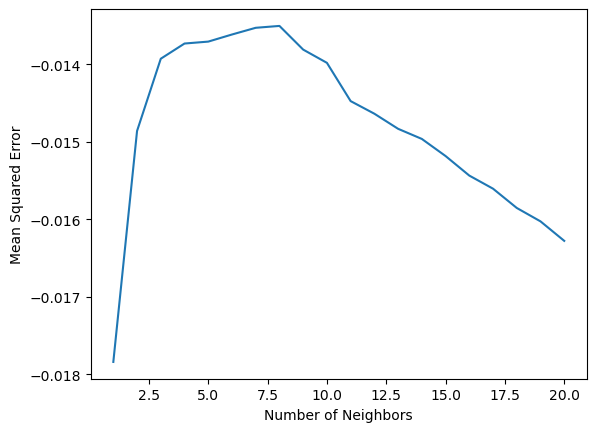

Best number of neighbors: 8


In [59]:
from sklearn.model_selection import cross_val_score

# Cross-validation to tune the number of neighbors
k_range = range(1, 21)
cv_scores = []

for k in k_range:
    knn = KNeighborsRegressor(n_neighbors=k)
    scores = cross_val_score(knn, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error')
    cv_scores.append(np.mean(scores))

# Plot the cross-validation results
import matplotlib.pyplot as plt

plt.plot(k_range, cv_scores)
plt.xlabel('Number of Neighbors')
plt.ylabel('Mean Squared Error')
plt.show()

# Select the best k (lowest MSE)
best_k = k_range[np.argmax(cv_scores)]
print(f'Best number of neighbors: {best_k}')


In [60]:
#permutation feature importance

from sklearn.inspection import permutation_importance

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

result = permutation_importance(knn, X_test_scaled, y_test, n_repeats=10, random_state=42)

importance = result.importances_mean
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importance
}).sort_values(by='Importance', ascending=False)

print("Top 10 features: ")
print(feature_importance.head(10))


Mean Squared Error: 0.013589114666136725
R-squared: 0.8949290363865613


NotFittedError: This KNeighborsRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

# Nonlinear: Xgboost Shap anlysis

In [19]:
#make sure all inputs are in correct formats
x_gd = all_race_no_kid[top_100_features]
state = all_race['State']
y_numpy = y.values.reshape(-1, 1) 

x_scaled_gd = scaler.fit_transform(x_gd)
x_scaled_gd = pd.DataFrame(x_scaled_gd, columns=x_gd.columns)
x_scaled_gd['state'] = state
x_scaled_gd['fips'] = fips

y_full_metadata = pd.DataFrame({
    'y': y_numpy.flatten(),  # Ensure y is a 1D array
    'state': x_scaled_gd['state'],  # Match state and fips from X
    'fips': x_scaled_gd['fips']
})

# X_train, X_test, y_train, y_test = train_test_split(x_scaled_gd, y_numpy, test_size=0.2, random_state=222)



In [20]:
import warnings
warnings.filterwarnings("ignore")
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import mean_squared_error

# Perform a stratified train_test_split using the 'state' column for stratification
X_train, X_test, y_train_metadata, y_test_metadata = train_test_split(
    x_scaled_gd, y_full_metadata, test_size=0.2, random_state=222, stratify=y_full_metadata['state']
)

# Extract y_train and y_test from metadata
y_train = y_train_metadata['y'].values  
y_test = y_test_metadata['y'].values

# Preserve metadata for later analysis (e.g., LIME)
X_train_metadata = X_train[['state', 'fips']] 
X_test_metadata = X_test[['state', 'fips']]  

# Drop categorical columns before training XGBoost
X_train = X_train.drop(columns=['state', 'fips'])
X_test = X_test.drop(columns=['state', 'fips'])

# Initialize the XGBoost model
xgb_model = xgb.XGBRegressor(
    verbosity=0,
    objective='reg:squarederror',  
    random_state=42
)

# Parameter grid for grid search
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300]
}

# Set up cross-validation using KFold
cv = KFold(n_splits=5, shuffle=True, random_state=222)

grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=cv,
    n_jobs=-1
)

# Fit the grid search using the training data
grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)
print("Best CV Score (negative MSE):", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Test MSE:", mse)

Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}
Best CV Score (negative MSE): -0.005464364923099063
Test MSE: 0.00573579974077268


In [ ]:
import shap
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)
mean_shap = np.mean(shap_values, axis=0)

# Identify indices for top 10 positive and negative features based on mean SHAP values
top10_pos_indices = np.argsort(mean_shap)[-10:]
top10_neg_indices = np.argsort(mean_shap)[:10]

print("\nTop 10 Positive Features (increase prediction):")
for idx in top10_pos_indices[::-1]:
    print(f"{top_100_features[idx]}: Mean SHAP = {mean_shap[idx]:.4f}")

print("\nTop 10 Negative Features (decrease prediction):")
for idx in top10_neg_indices:
    print(f"{top_100_features[idx]}: Mean SHAP = {mean_shap[idx]:.4f}")


Top 10 Positive Features (increase prediction):
HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021: Mean SHAP = 0.0085
Prevention_percent_pop_with_routine_health_checkup_PLACES_BRFSS_2021: Mean SHAP = 0.0012
Percent_Female_Population_Under_Poverty_ACS2016_20: Mean SHAP = 0.0010
Percent_Male_Population_Under_Poverty_ACS2016_20: Mean SHAP = 0.0008
RiskBehavior_percent_pop_smoking_Places_BRFSS_2021: Mean SHAP = 0.0006
Percent_Population_In_Management_Business_Science_And_Arts_Occupations_ACS2016_20: Mean SHAP = 0.0004
PCT_FREE_LUNCH15: Mean SHAP = 0.0004
Percent_Male_16_64yrs_Old_Not_In_Labor_Force_ACS2016_20: Mean SHAP = 0.0004
Per_Capita_Income_In_the_Past_Year_ACS2016_20: Mean SHAP = 0.0004
Total_population_Percentage_Households_With_Severe_Housing_Cost_Burden: Mean SHAP = 0.0004

Top 10 Negative Features (decrease prediction):
Amount_of_SNAP_Benefits_Per_Capita_USDA_2017: Mean SHAP = -0.0017
Percentage_Children_Eligible_For_Free_Or_Reduced_Price_Lunch_2017_18_CHR: Mea

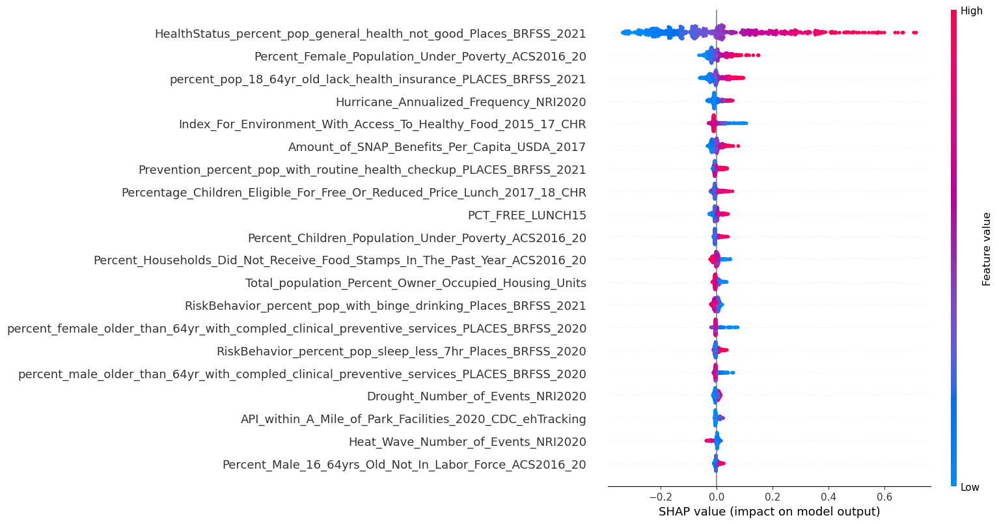

In [ ]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(
    shap_values,
    X_test,
    feature_names=top_100_features,
    max_display=20
)


In [ ]:
import numpy as np
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
from IPython.display import display

# Define the states of interest
states_of_interest = ["IA", "SD", "MN", "MT", "WY", "ID", "UT"]


for state in states_of_interest:
    # Find indices for the chosen state
    state_indices = X_test_metadata[X_test_metadata['state'] == state].index
    
    if len(state_indices) == 0:
        print(f"No test instances found for state: {state}")
        continue
    
    # Pick the first instance from that state
    index_to_explain = state_indices[0]
    data_row = X_test.loc[index_to_explain].values
    
    # LIME prediction function (must accept 2D array)
    def predict_fn(x):
        return best_model.predict(x)
    
    # Create the LimeTabularExplainer
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=X_train.columns,
        mode='regression',  # or 'classification' as appropriate
        discretize_continuous=False
    )
    
    # Explain this single instance
    exp = explainer.explain_instance(
        data_row,
        predict_fn,
        num_features=10
    )
    
    # Display LIME explanation (bar chart + table) in the notebook
    display(exp.show_in_notebook())


None

None

None

None

None

None

None

In [ ]:
print("Unique states in X_test_metadata:", X_test_metadata['state'].unique())

Unique states in X_test_metadata: ['IL' 'KY' 'NV' 'MO' 'IN' 'NJ' 'GA' 'VA' 'KS' 'OH' 'CO' 'VT' 'AR' 'WY'
 'TX' 'MS' 'SD' 'NC' 'MI' 'UT' 'LA' 'NE' 'FL' 'WA' 'NY' 'WV' 'AL' 'IA'
 'TN' 'PA' 'OR' 'OK' 'MN' 'MD' 'ID' 'NM' 'CA' 'ND' 'MA' 'CT' 'AZ' 'AK'
 'SC' 'WI' 'NH' 'MT' 'ME' 'DE' 'HI' 'RI']


# GAM Analysis

In [18]:
import pandas as pd
import numpy as np
from pygam import LinearGAM, s
import matplotlib.pyplot as plt

gam_df = all_race_no_kid[top_50_features]

# Define target and features
features = gam_df.columns  # Assuming 50 selected SDOH features

X = gam_df[features].values
y = all_race_clean['HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021'].values

# Train GAM model
gam = LinearGAM(sum([s(i) for i in range(50)], start=s(0)))
gam.fit(X, y)

LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) + s(7) + s(8) + s(9) + s(10) + s(11) + s(12) + s(13) + s(14) + s(15) + s(16) + s(17) + s(18) + s(19) + s(20) + s(21) + s(22) + s(23) + s(24) + s(25) + s(26) + s(27) + s(28) + s(29) + s(30) + s(31) + s(32) + s(33) + s(34) + s(35) + s(36) + s(37) + s(38) + s(39) + s(40) + s(41) + s(42) + s(43) + s(44) + s(45) + s(46) + s(47) + s(48) + s(49) + intercept,
   tol=0.0001, verbose=False)

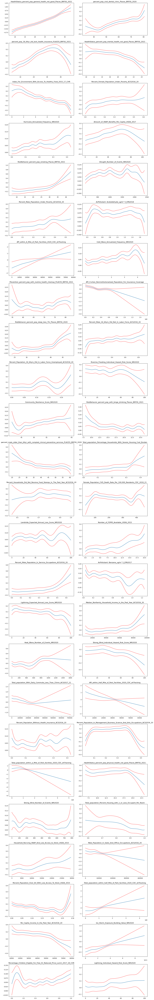

In [33]:
# Plot feature effects
fig, axs = plt.subplots(25, 2, figsize=(15, 100))
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < len(features):
        # Create a new 2D array with all features, except for the ith feature, fixed at their mean
        XX = np.tile(X[:, i].mean(), (100, X.shape[1]))  # Initialize XX with the means of all features
        XX[:, i] = np.linspace(X[:, i].min(), X[:, i].max(), 100)  # Vary only the i-th feature

        # Plot partial dependence
        ax.plot(XX[:, i], gam.partial_dependence(i, XX), label=features[i])
        ax.plot(XX[:, i], gam.partial_dependence(i, XX, width=0.95)[1], c='red', ls='--')
        ax.set_title(features[i])

plt.tight_layout()
plt.show()


In [34]:
pd_ranges = []
pd_directions = []

for i in range(X.shape[1]):
    XX = np.tile(X[:, i].mean(), (100, X.shape[1]))  # Keep others fixed at mean
    XX[:, i] = np.linspace(X[:, i].min(), X[:, i].max(), 100)  # Vary only i-th feature
    pd_vals = gam.partial_dependence(i, XX)
    pd_range = pd_vals.max() - pd_vals.min()
    
    # Direction: correlation between the feature values and partial dependence
    slope = np.corrcoef(XX[:, i], pd_vals)[0, 1]
    
    pd_ranges.append(pd_range)
    pd_directions.append(slope)

# Create dataframe with results
importance_df = pd.DataFrame({
    'Feature': features,
    'PartialDependenceRange': pd_ranges,
    'Slope': pd_directions
}).sort_values('PartialDependenceRange', ascending=False)

# Display top features with direction
print(importance_df)
print(importance_df[importance_df['Feature'] == 'Total_population_With_Daily_Commute_Less_Than_15min_ACS2017_21'])



                                                                                     Feature  \
38                     Total_population_within_a_Mile_of_Park_facilities_2020_CDC_ehTracking   
12                                  API_within_A_Mile_of_Park_Facilities_2020_CDC_ehTracking   
45                  Total_population_within_half_Mile_of_Park_facilities_2020_CDC_ehTracking   
35                               API_within_Half_Mile_of_Park_Facilities_2020_CDC_ehTracking   
15                       API_Civilian_Noninstitutionalized_Population_For_Insurance_Coverage   
0                         HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021   
47                                                 Ice_Storm_Exposure_Building_Value_NRI2020   
43                                Male_Population_In_Sales_And_Office_Occupations_ACS2016_20   
8                                         RiskBehavior_percent_pop_smoking_Places_BRFSS_2021   
28                                 Perce

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np
from pygam import LinearGAM, s

# Number of trials for averaging
n_trials = 10
n_splits = 5  # For cross-validation

val_mse_scores = []
test_mse_scores = []
cv_mse_scores = []
train_mse_scores = []

for _ in range(n_trials):
    # Split data into training (70%), validation (15%), and testing (15%)
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=None)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=None)

    # Train GAM model
    gam = LinearGAM(sum([s(i) for i in range(50)], start=s(0)))
    gam.fit(X_train, y_train)

    # Training MSE
    y_train_pred = gam.predict(X_train)
    train_mse_scores.append(mean_squared_error(y_train, y_train_pred))

    # Validation MSE
    y_val_pred = gam.predict(X_val)
    val_mse_scores.append(mean_squared_error(y_val, y_val_pred))

    # Test MSE
    y_test_pred = gam.predict(X_test)
    test_mse_scores.append(mean_squared_error(y_test, y_test_pred))

    # Cross-validation
    fold_mse_scores = []
    for _ in range(n_splits):
        X_train_cv, X_test_cv, y_train_cv, y_test_cv = train_test_split(X, y, test_size=0.3, random_state=None)
        gam_cv = LinearGAM(sum([s(i) for i in range(50)], start=s(0)))
        gam_cv.fit(X_train_cv, y_train_cv)
        y_pred_cv = gam_cv.predict(X_test_cv)
        fold_mse_scores.append(mean_squared_error(y_test_cv, y_pred_cv))

    cv_mse_scores.append(np.mean(fold_mse_scores))

# Compute and print average MSEs
print(f"Average Training MSE over {n_trials} trials: {np.mean(train_mse_scores):.4f} ± {np.std(train_mse_scores):.4f}")
print(f"Average Validation MSE over {n_trials} trials: {np.mean(val_mse_scores):.4f} ± {np.std(val_mse_scores):.4f}")
print(f"Average Test MSE over {n_trials} trials: {np.mean(test_mse_scores):.4f} ± {np.std(test_mse_scores):.4f}")
print(f"Average Cross-Validation MSE over {n_trials} trials: {np.mean(cv_mse_scores):.4f} ± {np.std(cv_mse_scores):.4f}")


KeyboardInterrupt: 

In [27]:
gam.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                    462.7801
Link Function:                     IdentityLink Log Likelihood:                               -198465.3236
Number of Samples:                         2200 AIC:                                           397858.2075
                                                AICc:                                          398106.6553
                                                GCV:                                                0.0066
                                                Scale:                                              0.0042
                                                Pseudo R-Squared:                                   0.9748
Feature Function                  Lam

/var/folders/dh/t016p6ms66zc3_d2crms5hlw0000gn/T/ipykernel_58064/3358381670.py:1: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  gam.summary()


In [26]:
import numpy as np

gam.statistics_['edof_per_term']


KeyError: 'edof_per_term'

# More Local Analysis